<a href="https://colab.research.google.com/github/Amart85/100-Days-Of-ML-Code/blob/master/Weights_and_Biases_Churn_Contest_with_Artifacts_Sweeps_and_more.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://wandb.me/logo-im-png" width="400" alt="Weights & Biases" />

<div><img /></div>

<img src="https://i.imgur.com/uEtWSEb.png" width="650" alt="Weights & Biases" />

<div><img /></div>


## 🤩 A shared dashboard for your experiments

With just a few lines of code,
you'll get rich, interactive, shareable dashboards [which you can see yourself here](https://wandb.ai/wandb/wandb_example).
![](https://i.imgur.com/Pell4Oo.png) 


# Introduction

In this Notebook we'll introduce you to a simple churn detection task using Weights and Biases. You can then take the example and build upon it using the contest dataset. Or if you want to work at your own place feel free! In that case, some links to get you started with self-learning are below:

## Self-learning links
- [Quickstart Guide - Documentation](https://docs.wandb.ai/quickstart)
- [Example dashboard](https://wandb.ai/wandb/wandb_example)

## Contest steps

In this Notebook we'll walk through how to use Weights and biases for 

- Experiment Tracking, 
- Dataset Versioning, 
- Hyperparameter Sweeps, and finally 
- Report generation

As part of your contest submission you'll need to share a _brief_ Report: don't make it too long! Pretend as though you were writing to colleague or team lead and were sharing your important findings with them. Some topics to consider mentioning: 

- which you observe from testing different hyperparameters
- why you chose the model and hyperparameters you did
- anything else you found interesting
- what you would do in the future / if you had more time

## Submitting your results

To be entered into the contest to win awesome W&B swag make sure to fill out and submit the short quiz here: [W&B Quiz](https://docs.google.com/forms/d/1W61VsxcpXLGjIw81Mdnrzj_HU2Vt4yekHDRTZMSJSeQ/viewform?edit_requested=true)

In [ ]:
!pip install -qqq wandb
!pip install -qqq pandas-profiling==3.1.0

     |████████████████████████████████| 1.8 MB 8.1 MB/s 
     |████████████████████████████████| 181 kB 74.8 MB/s 
     |████████████████████████████████| 156 kB 71.8 MB/s 
     |████████████████████████████████| 63 kB 1.9 MB/s 
     |████████████████████████████████| 261 kB 7.9 MB/s 
     |████████████████████████████████| 596 kB 42.1 MB/s 
     |████████████████████████████████| 303 kB 75.2 MB/s 
     |████████████████████████████████| 690 kB 43.3 MB/s 
     |████████████████████████████████| 3.1 MB 59.4 MB/s 
     |████████████████████████████████| 102 kB 12.7 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
     |████████████████████████████████| 812 kB 76.7 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.28.1 which is incompatible.
datascience 0.10.6 requires folium==0

In [ ]:
# utilities
import os
import tempfile

# Weights and Biases library
import wandb

# working with tabular and numeric data
import pandas as pd
import numpy as np

# visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# quick, exploratory data analysis
from pandas_profiling import ProfileReport

# scikit-learn: your ML multi tool
from sklearn.model_selection import train_test_split

# machine and deep learning libraries
import tensorflow as tf
from tensorflow import keras
from wandb.keras import WandbCallback
from keras.callbacks import EarlyStopping

## 🪄 Install `wandb` library and login


Start by installing the library and logging in to your free account.

Create an [account here](https://wandb.ai/login?signup=true) if you don't already have one.

In [ ]:
wandb.login()

<IPython.core.display.Javascript object>

## 1 - 📊  Fetch and load the data

The data that we'll be using is a [customer churn dataset](https://www.kaggle.com/datasets/sakshigoyal7/credit-card-customers) that someone has curated and uploaded to the data science platform, Kaggle. 

There are some great award-winning Notebooks that make use of Weights and Biases on the Kaggle website and we even have a few Kaggle Masters, a title awarded to those participants who have repeatedly won many Kaggle contests, working at Weights and Biases.

### Note

- The dataset consists of 10,000 customers and includes variables about their age, salary, marital_status, credit card limit, credit card category ("Platinum", etc. There are 19 variables and one target column, `Attrition_Flag`.

- A fraction of the customers 16.07% end up churning. Thus, depending on what type of model you choose, it might be challenging to get great performance. (But fear not! Weights and Biases can help you!)

### 1.1 Fetch Data


In this notebook, we'll show you how to use W&B Artifacts (🏺)
to track your ML experiment pipelines (🧪).
Our sophisticated mathematical models predict the following result:

$$
{\Huge
🧪 + 🏺 = 😃}
$$



🏺 Artifacts are light-weight **dataset version** AND **model versioning** in the Weights & Biases universe. 

 ![](https://gblobscdn.gitbook.com/assets%2F-Lqya5RvLedGEWPhtkjU%2F-M94QAXA-oJmE6q07_iT%2F-M94QJCXLeePzH1p_fW1%2Fsimple%20artifact%20diagram%202.png?alt=media&token=94bc438a-bd3b-414d-a4e4-aa4f6f359f21)

Artifacts allow for 

- **Effortless observability**: Add just a few lines to your scripts and we'll build a dependency graph for you. Trace the flow of data through your pipeline, so you know exactly which datasets feed into your models.
- **Incremental tracking**: refine your models by using different versions of data; We'll track the evolution of your data over time and preserve checkpoints of your best performing models.

For more information on Artifacts check out
- 🏺 Documentation: [Artifacts Core Concepts](https://docs.wandb.ai/guides/artifacts/artifacts-core-concepts)
- [🏺 Artifacts YouTube walkthrough (with a Notebook)🏺](https://www.youtube.com/watch?v=Hd94gatGMic
 ) - 35 min: 



In [ ]:
# import wandb
run = wandb.init() #resume=True
artifact = run.use_artifact('events/churn_dataset/BankChurners_for_contest.csv:latest', type='contest_data')
artifact_dir = artifact.download()

wandb: Currently logged in as: andrea0 (events). Use `wandb login --relogin` to force relogin


In [ ]:
# importing the dataset
churn_df = pd.read_csv("/content/artifacts/BankChurners_for_contest.csv:v0/BankChurners_for_contest.csv")
churn_df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,778239933,Existing Customer,45,F,4,Graduate,Married,Unknown,Blue,35,...,3,0,2801.0,2043,758.0,0.583,1241,46,0.643,0.729
1,714893733,Existing Customer,55,M,1,High School,Married,$80K - $120K,Blue,45,...,3,3,16794.0,809,15985.0,1.566,1917,33,0.941,0.048
2,754886958,Existing Customer,48,F,3,College,Divorced,$40K - $60K,Blue,41,...,1,3,9336.0,1672,7664.0,0.696,1391,39,0.625,0.179
3,710104908,Existing Customer,56,F,5,College,Single,Less than $40K,Blue,43,...,1,0,2763.0,2517,246.0,0.938,1246,31,0.824,0.911
4,710558883,Existing Customer,41,M,3,Uneducated,Married,$60K - $80K,Blue,36,...,3,2,17391.0,1044,16347.0,1.080,1248,27,0.688,0.060
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9622,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
9623,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
9624,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
9625,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


The `CLIENTNUM` column is essentially the row number from a database, so we remove  it.

Note that for the heldout dataset that you'll be prediction on you'll want to **retain** the `CLIENTNUM` and the `Attrition_Flag` and make a (csv, tsv, txt) prediction that looks like the information below:

|   CLIENTNUM  |   Attrition_Flag     |
|--------------|----------------------|
|   778239933  |   Existing Customer  |
|   714893733  |   Existing Customer  |
|   719443683  |   Attrited Customer  |
|   720267033  |   Existing Customer  |
|   712049208  |   Existing Customer  |
|   708688608  |   Existing Customer  |
|   716223708  |   Attrited Customer  |

In [ ]:
# removing unecessary columns and reseting indexes
churn_df.drop(columns=['CLIENTNUM'], inplace=True)
churn_df.reset_index(drop=True,inplace=True)
churn_df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,F,4,Graduate,Married,Unknown,Blue,35,6,3,0,2801.0,2043,758.0,0.583,1241,46,0.643,0.729
1,Existing Customer,55,M,1,High School,Married,$80K - $120K,Blue,45,3,3,3,16794.0,809,15985.0,1.566,1917,33,0.941,0.048
2,Existing Customer,48,F,3,College,Divorced,$40K - $60K,Blue,41,4,1,3,9336.0,1672,7664.0,0.696,1391,39,0.625,0.179
3,Existing Customer,56,F,5,College,Single,Less than $40K,Blue,43,4,1,0,2763.0,2517,246.0,0.938,1246,31,0.824,0.911
4,Existing Customer,41,M,3,Uneducated,Married,$60K - $80K,Blue,36,5,3,2,17391.0,1044,16347.0,1.080,1248,27,0.688,0.060


In [ ]:
# saving to csv
churn_df.to_csv("awesome_churn_dataset.csv", index=False)

In [ ]:
# Saving artifact to wandb
!wandb artifact put \
       --name awesome_churn_task/awesome_churn_dataset.csv \
       --type raw_data \
       --description "Customer Churn Prediction Task" awesome_churn_dataset.csv

wandb: Uploading file awesome_churn_dataset.csv to: "events/awesome_churn_task/awesome_churn_dataset.csv:latest" (raw_data)
wandb: Currently logged in as: andrea0 (events). Use `wandb login --relogin` to force relogin
wandb: Tracking run with wandb version 0.12.21
wandb: Run data is saved locally in /content/wandb/run-20220728_072749-3cq9qkec
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run autumn-breeze-1
wandb: ⭐️ View project at https://wandb.ai/events/awesome_churn_task
wandb: 🚀 View run at https://wandb.ai/events/awesome_churn_task/runs/3cq9qkec
Artifact uploaded, use this artifact in a run by adding:

    artifact = run.use_artifact("events/awesome_churn_task/awesome_churn_dataset.csv:latest")

wandb: Waiting for W&B process to finish... (success).
wandb:                                                                                
wandb: Synced autumn-breeze-1: https://wandb.ai/events/awesome_churn_task/runs/3cq9qkec
wandb: Synced 5 W&B file(s), 0 media file(

### ‍🔬  1.2 Exploratory Data Analysis (EDA)

In [ ]:
# The save_code param: tracks all changes of the notebook and sync with `wandb`
run = wandb.init(project="awesome_churn_task")

In [ ]:
# download the latest version of artifact raw_data.csv
artifact = run.use_artifact("awesome_churn_task/awesome_churn_dataset.csv:latest")

# create a dataframe from the artifact
df = pd.read_csv(artifact.file())

#### 1.2.1 🐼 Pandas Profiling

🐼`pandas-profiling` makes quick work of "getting a feel for your data". Note that it's not well suited to unstructured text data or images, but for our churn dataset which is largely comprised of quantitative data, no unstructured text data, and no images or video `pandas-profiling` will work well!

Fullstory_dot_com_categorical_vs_quantitative_data.svg

In [ ]:
ProfileReport(df, title= "Pandas Profiling Report", explorative=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Obviously, if you're using sensor data or other kinds of information that is better explored visually, you'll want to use something other than `pandas-profiling`. 

You can use Tables (inside of a Report) to view some region assignments in a dataset and explore the data in many other ways using Tables: https://wandb.ai/stacey/deep-drive/reports/The-View-from-the-Driver-s-Seat--Vmlldzo1MTg5NQ

In [ ]:
run.finish()

### ⚙️ 1.3 Preprocessing

In [ ]:
input_artifact="awesome_churn_task/awesome_churn_dataset.csv:latest"
artifact_name="preprocessed_data.csv"
artifact_type="clean_data" 
artifact_description="Data after preprocessing"

In [ ]:
# create a new job_type
run = wandb.init(project="awesome_churn_task", job_type="process_data")

In [ ]:
# download the latest version of artifact raw_data.csv
artifact=run.use_artifact(input_artifact)

# create a dataframe from the artifact
df = pd.read_csv(artifact.file())

We can perform more advanced preprocesing but we'll leave that as an exercise to the reader, you!

In [ ]:
df_gender = pd.get_dummies(df['Gender'])
df_edu = pd.get_dummies(df['Education_Level'])
df_marital = pd.get_dummies(df['Marital_Status'])
df_income = pd.get_dummies(df['Income_Category'])
df_card = pd.get_dummies(df['Card_Category'])

In [ ]:
df_new = pd.concat([df, df_gender, df_edu, df_marital, df_income, df_card], axis=1).reindex(df.index)
df_new.drop(columns=['Gender','Education_Level','Marital_Status','Income_Category','Card_Category'], inplace=True)
df_new.head()

,Attrition_Flag,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,...,$120K +,$40K - $60K,$60K - $80K,$80K - $120K,Less than $40K,Unknown,Blue,Gold,Platinum,Silver
0,Existing Customer,45,4,35,6,3,0,2801.0,2043,758.0,...,0,0,0,0,0,1,1,0,0,0
1,Existing Customer,55,1,45,3,3,3,16794.0,809,15985.0,...,0,0,0,1,0,0,1,0,0,0
2,Existing Customer,48,3,41,4,1,3,9336.0,1672,7664.0,...,0,1,0,0,0,0,1,0,0,0
3,Existing Customer,56,5,43,4,1,0,2763.0,2517,246.0,...,0,0,0,0,1,0,1,0,0,0
4,Existing Customer,41,3,36,5,3,2,17391.0,1044,16347.0,...,0,0,1,0,0,0,1,0,0,0


In [ ]:
# Simple way of turning our target variable into a binary value
df_new["Attrition_Flag"] = (df_new["Attrition_Flag"]
 .str.replace("Existing Customer", "0")
 .str.replace("Attrited Customer", "1")
)

df_new["Attrition_Flag"]=df_new["Attrition_Flag"].astype(int)

In [ ]:
##########################################
#
# Do whatever else you want to perform on
# the dataset for pre-processing!
#
# 
##########################################

# generate a "clean data file"
df_new.to_csv(artifact_name, index=False)

In [ ]:
# Create a new artifact and configure with the necessary arguments
artifact = wandb.Artifact(name=artifact_name,
                         type=artifact_type,
                         description=artifact_description)
artifact.add_file(artifact_name)
run.log_artifact(artifact)
run.finish()

Note that we could have used some other `scikit-learn` functionality, but to keep it very, very simple we one-hot encoded things. You will probably want to try using some of the following to see how they impact performance:

- `MinMaxScaler`
- `TransformerMixin`
- `StandardScaler`
- `LabelEncoder`
- `OneHotEncoder`
- `Pipeline`

## 2 - Data Splitting

In this section we divide our data into Train and Test datasets, and then into a Validation dataset.

We retain those split datasets up in the Artifacts tool.

## 2.1 Creating a training and test data split

In [ ]:
# ratio - 70% train / 30% test
test_size = 0.30

# seed used to reproduce purposes
seed = 23427

# column on which to stratify the data
stratification_column = "Attrition_Flag"

# name of the input artifact
artifact_input_name = run.use_artifact("awesome_churn_task/preprocessed_data.csv:latest")

# type of the artifact
artifact_type = "train_test_split_data"

In [ ]:
# init wandb project
run = wandb.init(project="awesome_churn_task", job_type="split_data")

# logger.info("Downloading and reading artifact")
artifact=run.use_artifact(artifact_input_name)
artifact_path=artifact.file()
df = pd.read_csv(artifact_path)

# Split into train and test
# logger.info("Splitting data into train and test")
splits = {}

splits["train"], splits["test"] = train_test_split(df,
                                                  test_size=test_size,
                                                  random_state=seed,
                                                  stratify=df[stratification_column])

# Save more than one Artifact below:
with tempfile.TemporaryDirectory() as temp_dir:
    
    for split, df in splits.items():
        
        # Artifact name is the name of the split plus the `temp_dir` filepath
        artifact_name = f"{split}.csv"
        
        # Create the path including the temp directory and the artifact name
        temp_path = os.path.join(temp_dir,artifact_name)
                
        # Save dataframes to our temporary directory 
        df.to_csv(temp_path,index=False)
        
        artifact = wandb.Artifact(name=artifact_name,
                                 type= "train_test_split_data",
                                 description=f"{split} split of dataset {artifact_input_name}")
        artifact.add_file(temp_path)
        
        run.log_artifact(artifact)
        
        artifact.wait()

Note that the image below is from a similar (but non-indentical) workflow to what we just did above, so your Artifacts workflow will look slightly different.

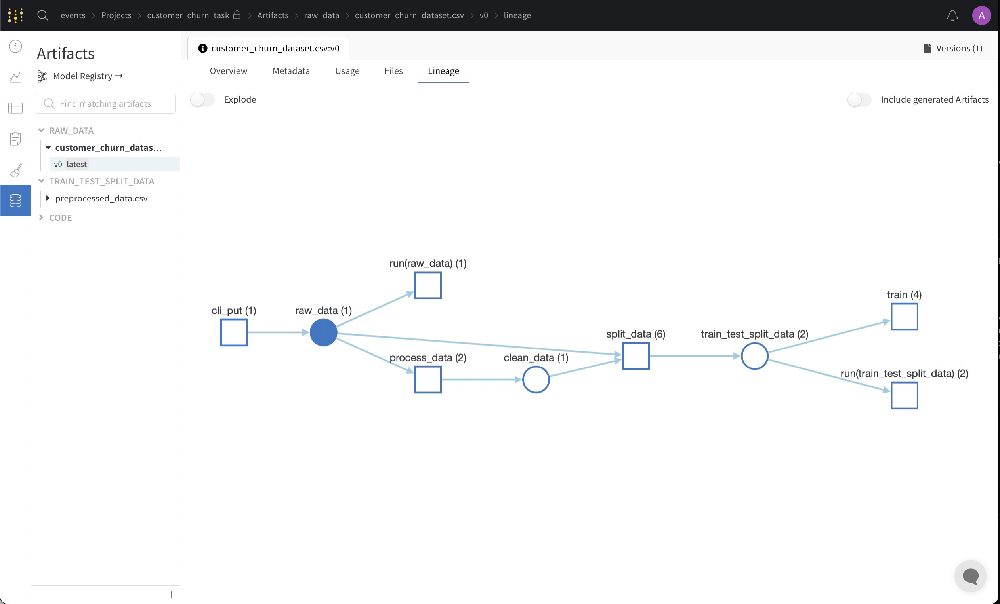

###  ✅ 2.2 Create a Validation dataset


In [ ]:
# column on which to stratify the data
stratification_column = "Attrition_Flag"

# name of the input artifact
artifact_input_name = "awesome_churn_task/train.csv:latest"

# type of the artifact
artifact_type = "Train"

In [ ]:
#initiate the wandb project
run = wandb.init(project="awesome_churn_task", job_type="train")


# ratio - 70% train / 30% validation
validation_size = 0.30
stratify = "Attrition_Flag"

#Downloading and reading the training artifact
local_path = run.use_artifact(artifact_input_name).file()
df_train = pd.read_csv(local_path)

splits = {}

# Spliting train.csv into train and validation dataset
splits["x_train"], splits["x_val"], splits["y_train"], splits["y_val"]  = train_test_split(df_train.drop(labels=stratify,axis=1),
                                                  df_train[stratify],
                                                  test_size=validation_size,
                                                  random_state=seed,
                                                  shuffle=True,
                                                  stratify=df_train[stratify])

x_train, x_val, y_train, y_val  = train_test_split(df_train.drop(labels=stratify,axis=1),
                                                  df_train[stratify],
                                                  test_size=validation_size,
                                                  random_state=seed,
                                                  shuffle=True,
                                                  stratify=df_train[stratify])


# Save artifacts; all four (2 datasets; 2 targets)
with tempfile.TemporaryDirectory() as temp_dir:
    
    for split, df in splits.items():
        
        # Artifact name is the name of the split plus the `temp_dir` filepath
        artifact_name = f"{split}.csv"
        
        # Create the path including the temp directory and the artifact name
        temp_path = os.path.join(temp_dir,artifact_name)
                
        # Save dataframes to our temporary directory 
        df.to_csv(temp_path,index=False)
        
        artifact = wandb.Artifact(name=artifact_name,
                                 type= "train_val_split_data",
                                 description=f"{split} split of dataset {artifact_input_name}")
        artifact.add_file(temp_path)
        
        run.log_artifact(artifact)
        
        artifact.wait()

Notice the four datasets - the train x and y and validation x and y datasets - to the far right. We just made those!

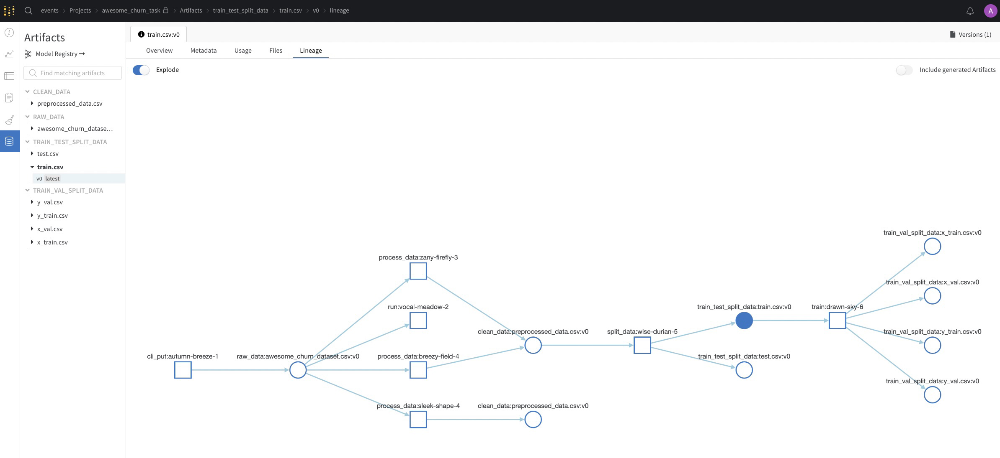

In [ ]:
print("x train dimensions: {}".format(x_train.shape))
print("y train dimensions: {}".format(y_train.shape))
print("x val dimensions: {}".format(x_val.shape))
print("y val dimensions: {}".format(y_val.shape))

x train dimensions: (4716, 37)
y train dimensions: (4716,)
x val dimensions: (2022, 37)
y val dimensions: (2022,)


# 🏋️ 4 - Training

In [ ]:
# run = wandb.init()
# artifact = run.use_artifact('awesome_churn_task/train.csv:latest', type='train_test_split_data')
# artifact_dir = artifact.download()
# run.finish()

## 4.1 Base Model

In [ ]:
# 4716 by 37
N, D = x_train.shape

In [ ]:
wandb.init(project="awesome_churn_task", config={"batch_size": 32})

# Instantiate a very simple classification model
model = tf.keras.Sequential([
  tf.keras.layers.Dense(13, kernel_initializer = 'uniform', activation='relu', input_dim = D),
  tf.keras.layers.Dense(12, kernel_initializer = 'uniform', activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid') # output always between 0 and 1
])

# Instantiate a logistic loss function that expects integer targets
loss = tf.keras.losses.BinaryCrossentropy()

# Instantiate an accuracy metric
accuracy = tf.keras.metrics.BinaryAccuracy()

# Instantiate an optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.02)

# configure the optimizer, loss, and metrics to monitor
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=[accuracy])

# training 
model.fit(x=x_train,
                    y=y_train,
                    epochs=15, # make this larger when training for real!
                    validation_data=(x_val,y_val),
                    callbacks=[WandbCallback()],
                    verbose=1)

wandb: WARNING The save_model argument by default saves the model in the HDF5 format that cannot save custom objects like subclassed models and custom layers. This behavior will be deprecated in a future release in favor of the SavedModel format. Meanwhile, the HDF5 model is saved as W&B files and the SavedModel as W&B Artifacts.


Instructions for updating:
Use `tf.compat.v1.graph_util.tensor_shape_from_node_def_name`


Instructions for updating:
Use `tf.compat.v1.graph_util.tensor_shape_from_node_def_name`


Epoch 1/15
  1/148 [..............................] - ETA: 1:56 - loss: 8.4670 - binary_accuracy: 0.2812WARNING:tensorflow:Callback method `on_train_batch_end` is slow compared to the batch time (batch time: 0.0026s vs `on_train_batch_end` time: 0.0026s). Check your callbacks.


148/148 [==============================] - 1s 4ms/step - loss: 1.3060 - binary_accuracy: 0.8242 - val_loss: 0.4335 - val_binary_accuracy: 0.8358 - _timestamp: 1658994576.0000 - _runtime: 7.0000
Epoch 2/15
148/148 [==============================] - 0s 3ms/step - loss: 0.4093 - binary_accuracy: 0.8352 - val_loss: 0.4349 - val_binary_accuracy: 0.8358 - _timestamp: 1658994577.0000 - _runtime: 8.0000
Epoch 3/15
148/148 [==============================] - 1s 4ms/step - loss: 0.4454 - binary_accuracy: 0.8359 - val_loss: 0.4324 - val_binary_accuracy: 0.8358 - _timestamp: 1658994577.0000 - _runtime: 8.0000
Epoch 4/15
148/148 [==============================] - 0s 3ms/step - loss: 0.4174 - binary_accuracy: 0.8359 - val_loss: 0.4127 - val_binary_accuracy: 0.8358 - _timestamp: 1658994578.0000 - _runtime: 9.0000
Epoch 5/15
148/148 [==============================] - 0s 3ms/step - loss: 0.4126 - binary_accuracy: 0.8359 - val_loss: 0.4261 - val_binary_accuracy: 0.8358 - _timestamp: 1658994578.0000 - _ru

https://wandb.ai/events/awesome_churn_task/runs/3tr6pz8u?workspace=user-andrea0

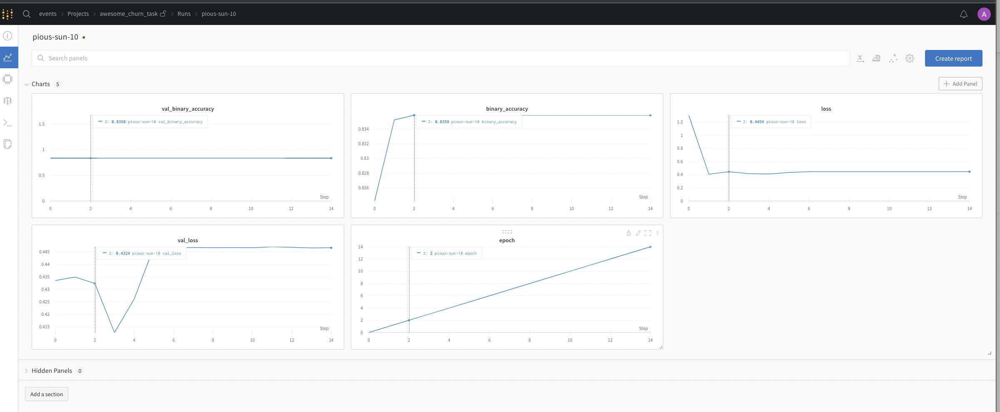

I think we can do better!

## 🧹 4.2 Hyperparameter Sweeps

In [ ]:
project_name = 'awesome_churn_task'
# # Default values for hyperparameters
# defaults = dict(
#                 layer_1 = 13,
#                 layer_2 = 12,
#                 learn_rate = 0.001,
#                 batch_size = 16,
#                 epoch = 10)

# wandb.init(project=project_name, config= defaults, name="first_run")
# config = wandb.config


# The sweep calls this function with each set of hyperparameters
def sweeps_basic():
    # Default values for hyper-parameters we're going to sweep over
    defaults = dict(layer_1 = 13,
                layer_2 = 12,
                learn_rate = 0.001,
                batch_size = 16,
                epoch = 100) # Increase this in real life
    
    # Initialize a new wandb run
    wandb.init(project=project_name, config= defaults)

    # Config is a variable that holds and saves hyperparameters and inputs
    config = wandb.config
    
    # Instantiate a simple classification model
    model = tf.keras.Sequential([
                                 tf.keras.layers.Dense(config.layer_1, activation=tf.nn.relu, dtype='float64'),
                                 tf.keras.layers.Dense(config.layer_2, activation=tf.nn.relu, dtype='float64'),
                                 tf.keras.layers.Dense(1, activation=tf.nn.sigmoid)
                                 ])

    # Instantiate a logistic loss function that expects integer targets.
    loss = tf.keras.losses.BinaryCrossentropy()

    # Instantiate an accuracy metric.
    accuracy = tf.keras.metrics.BinaryAccuracy()

    # Instantiate an optimizer.
    optimizer = tf.keras.optimizers.SGD(learning_rate=config.learn_rate)

    # configure the optimizer, loss, and metrics to monitor.
    model.compile(optimizer=optimizer, loss=loss, metrics=[accuracy])  

    model.fit(x_train, y_train, batch_size=config.batch_size,
              epochs=config.epoch,
              validation_data=(x_val, y_val),
              callbacks=[WandbCallback(),
                          EarlyStopping(patience=30)] # Increase this in real life
              )   

### Sweeps documentation

For an overview of the various parameters used in a Sweep configuration, please see the [Sweeps Documentation Page](https://docs.wandb.ai/guides/sweeps/configuration).

You do all kinds of interesting scaling of these values: logarthmic, etc. For readability we stick to enumerating the values that we want to sweep across.

In [ ]:
# Configure the sweep – specify the parameters to search through, the search strategy, the optimization metric et all.
sweep_config = {
    'method': 'random', #grid, random
    'metric': {
      'name': 'binary_accuracy',
      'goal': 'maximize'},   
       # See https://docs.wandb.ai/guides/sweeps/configuration#distribution
    'parameters': {       
        'learn_rate': {
            'values': [0.00001, 0.0001, 0.001] 
        },
        'epoch': {
            'values': [60,80,100]
        },
        'batch_size': {
            'values': [16,32,64]
        }
    }
}

In [ ]:
# Initialize a new sweep
ENTITY_NAME = 'events' #<-------------- Change this to your account's Entity name
PROJECT_NAME = 'awesome_churn_task'
# Arguments:
#     – sweep_config: the sweep config dictionary defined above
#     – entity: Set the username for the sweep : a_p in our case
#     – project: Set the project name for the sweep : our_wb_churn_task
sweep_id = wandb.sweep(sweep_config, entity=ENTITY_NAME, project=PROJECT_NAME)

Create sweep with ID: e7g5kurk
Sweep URL: https://wandb.ai/events/awesome_churn_task/sweeps/e7g5kurk


In [ ]:
# Initialize a new sweep
# Arguments:
#     – sweep_id: the sweep_id to run - this was returned above by wandb.sweep()
#     – function: function that defines your model architecture and trains it
wandb.agent(sweep_id = sweep_id, function=sweeps_basic, limit=10)

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.
wandb: Agent Starting Run: nf2ko23t with config:
wandb: 	batch_size: 64
wandb: 	epoch: 60
wandb: 	learn_rate: 1e-05
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


wandb: WARNING Unable to compute FLOPs for this model.


Epoch 1/60
74/74 [==============================] - 1s 6ms/step - loss: 66.2489 - binary_accuracy: 0.7439 - val_loss: 25.6992 - val_binary_accuracy: 0.6706 - _timestamp: 1658994846.0000 - _runtime: 7.0000
Epoch 2/60
74/74 [==============================] - 0s 3ms/step - loss: 39.2088 - binary_accuracy: 0.7557 - val_loss: 44.9672 - val_binary_accuracy: 0.8358 - _timestamp: 1658994847.0000 - _runtime: 8.0000
Epoch 3/60
74/74 [==============================] - 0s 3ms/step - loss: 35.4215 - binary_accuracy: 0.7608 - val_loss: 56.6008 - val_binary_accuracy: 0.8358 - _timestamp: 1658994847.0000 - _runtime: 8.0000
Epoch 4/60
74/74 [==============================] - 0s 3ms/step - loss: 34.0959 - binary_accuracy: 0.7665 - val_loss: 23.9719 - val_binary_accuracy: 0.8358 - _timestamp: 1658994847.0000 - _runtime: 8.0000
Epoch 5/60
74/74 [==============================] - 0s 3ms/step - loss: 25.8009 - binary_accuracy: 0.7508 - val_loss: 8.0956 - val_binary_accuracy: 0.6775 - _timestamp: 1658994847.

## 👀  Visualize Results
Click on the Sweep URL link above to see your live results.

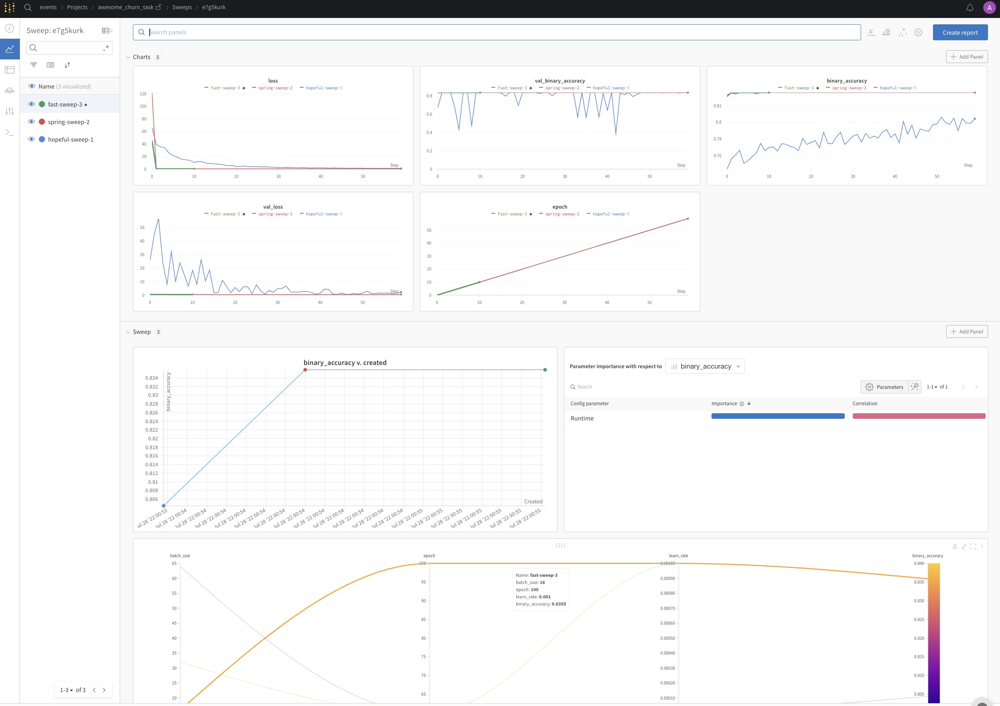

In [ ]:
loss, acc = model.evaluate(x=x_train,y=y_train, batch_size=32)
print('Train loss: %.4f - acc: %.4f' % (loss, acc))

loss_, acc_ = model.evaluate(x=x_val,y=y_val, batch_size=32)
print('Test loss: %.4f - acc: %.4f' % (loss_, acc_))

In [ ]:
predict = model.predict(x_val)

In [ ]:
predict

We created a very simple **Report** showing our hyperparameter sweeps here for you to review.**Reports** are a great way to quickly share findings with teammates, management or other stakeholders at your company: 


https://wandb.ai/a_p/our_wb_churn_task/reports/Customer-Churn-Model--VmlldzoyMzgxMzgy

# For you to do...

We'll leave the rest of the contest up to the user! Select the best performing model. And use that to generate predictions on the contest dataset, the `TO_PREDICT.csv` [dataset which can be found here](https://wandb.ai/events/churn_dataset/artifacts/predict_on_contest_data/TO_PREDICT_ON.csv/v0)

# Deliverables:

[Answer the questions here W&B Contest Entry for Swag](https://docs.google.com/forms/d/1W61VsxcpXLGjIw81Mdnrzj_HU2Vt4yekHDRTZMSJSeQ/viewform?edit_requested=true). Be sure to upload your dataset, add in a link to your Report, and answer the multiple choice questions.

Be sure to submit your predictions in the following format containing BOTH the `CLIENTNUM` and the `Attrition_Flag`; submissions should be in flat file (`csv`, `tsv`, or `txt` format).

|   CLIENTNUM  |   Attrition_Flag     |
|--------------|----------------------|
|   778239933  |   Existing Customer  |
|   714893733  |   Existing Customer  |
|   719443683  |   Attrited Customer  |
|   720267033  |   Existing Customer  |
|   712049208  |   Existing Customer  |
|   708688608  |   Existing Customer  |
|   716223708  |   Attrited Customer  |

# As you work on the Contest: Sample Reports

As you work on putting together your Report and contest submission feel free to reference some great example Reports included below:


- [**"Deep Drive"** Report](https://wandb.ai/stacey/deep-drive/reports/The-View-from-the-Driver%27s-Seat--Vmlldzo1MTg5NQ)
- [**Tables Tutorial: Visualize Data for Image Classification**](https://wandb.ai/stacey/mendeleev/reports/Tables-Tutorial-Visualize-Data-for-Image-Classification--VmlldzozNjE3NjA)
- [**Tabular Data Versioning and Deduplication with Weights and Biases**](https://wandb.ai/dpaiton/splitting-tabular-data/reports/Tabular-Data-Versioning-and-Deduplication-with-Weights-Biases--VmlldzoxNDIzOTA1)



---



---



---



## 🎨 Example Gallery
See examples of projects tracked and visualized with W&B in our [Gallery](https://wandb.ai/fully-connected) →

📏 Best Practices


1.   **Projects:** Log multiple runs to a project to compare them. `wandb.init(project="project-name")`
2.   **Groups:** For multiple processes or cross validation folds, log each process as a runs and group them together. wandb.init(group='experiment-1')
3.   **Tags:** Add tags to track your current baseline or production model.
4.   **Notes:** Type notes in the table to track the changes between runs.
5.   **Reports:** Take quick notes on progress to share with colleagues and make dashboards and snapshots of your ML projects.


# Bonus: Model Registry

For those of you who have scrolled down to the bottom of this Notebook there's a new feature that you may want to check out. 

Our new **Model Registry** tool allows you to take many versions of saved models and group them into collection, tagging best performing models, sharing just the collections that you want to share with teammates, and more: 

https://wandb.ai/registry/model